In [1]:
# Import libraries
using DataFrames
using LinearAlgebra
using Statistics
using XLSX
using Plots

In [2]:
# Download and extract the dataset
dataset_file = "DryBeanDataset/Dry_Bean_Dataset.xlsx"

if !isfile(dataset_file)
    run(`wget https://archive.ics.uci.edu/ml/machine-learning-databases/00602/DryBeanDataset.zip`)
    run(`unzip DryBeanDataset.zip`)
    run(`rm DryBeanDataset.zip`)
end

In [3]:
# Import the dataset
sheet = "Dry_Beans_Dataset"
df = DataFrame(XLSX.readtable(dataset_file, sheet))

Row,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any,Any
1,28395,610.291,208.178,173.889,1.19719,0.549812,28715,190.141,0.763923,0.988856,0.958027,0.913358,0.00733151,0.00314729,0.834222,0.998724,SEKER
2,28734,638.018,200.525,182.734,1.09736,0.411785,29172,191.273,0.783968,0.984986,0.887034,0.953861,0.00697866,0.00356362,0.909851,0.99843,SEKER
3,29380,624.11,212.826,175.931,1.20971,0.562727,29690,193.411,0.778113,0.989559,0.947849,0.908774,0.00724391,0.00304773,0.825871,0.999066,SEKER
4,30008,645.884,210.558,182.517,1.15364,0.498616,30724,195.467,0.782681,0.976696,0.903936,0.928329,0.00701673,0.00321456,0.861794,0.994199,SEKER
5,30140,620.134,201.848,190.279,1.0608,0.33368,30417,195.897,0.773098,0.990893,0.984877,0.970516,0.00669701,0.00366497,0.9419,0.999166,SEKER
6,30279,634.927,212.561,181.51,1.17107,0.520401,30600,196.348,0.775688,0.98951,0.943852,0.923726,0.00702007,0.00315278,0.85327,0.999236,SEKER
7,30477,670.033,211.05,184.039,1.14677,0.489478,30970,196.989,0.762402,0.984081,0.85308,0.933374,0.0069249,0.00324202,0.871186,0.999049,SEKER
8,30519,629.727,212.997,182.737,1.16559,0.51376,30847,197.124,0.770682,0.989367,0.967109,0.92548,0.00697915,0.00315829,0.856514,0.998345,SEKER
9,30685,635.681,213.534,183.157,1.16585,0.514081,31044,197.66,0.771561,0.988436,0.95424,0.925658,0.00695891,0.00315155,0.856844,0.998953,SEKER


In [6]:
# Extracting data matrix
m = Matrix(df[:,begin:end-1])
n = size(m)[1];

In [7]:
# Centering and rescaling features
mean = Statistics.mean(m, dims=1)
std = Statistics.std(m, dims=1)
m_standardized = (m.-mean)./std;

In [9]:
# Computing the covariance matrix
c = (transpose(m_standardized)*m_standardized)/n

# compute eigenvalues and eigenvectors
eig = eigen(c)
eigenvectors = reverse(eig.vectors)
eigenvalues = reverse(eig.values);

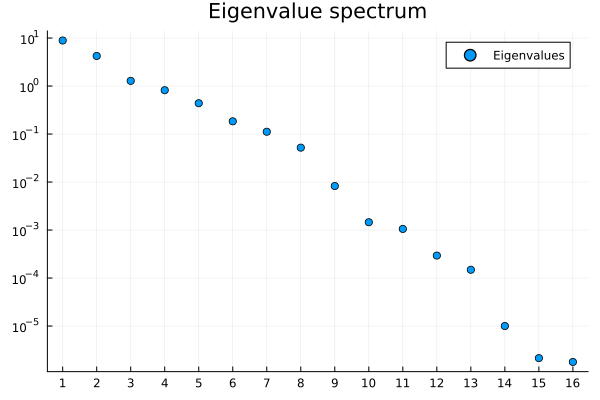

In [10]:
# Plotting the eigenvalue spectrum
plot(eigenvalues,
    seriestype=:scatter,
    label="Eigenvalues",
    xticks=1:length(eigenvalues),
    yscale=:log10,
    yticks=[10.0^i for i in ceil(log10(maximum(eigenvalues))):-1:floor(log10(minimum(eigenvalues)))],
    title = "Eigenvalue spectrum")

In [13]:
# Computing principal components of the dataset
pc = m_standardized*eigenvectors;

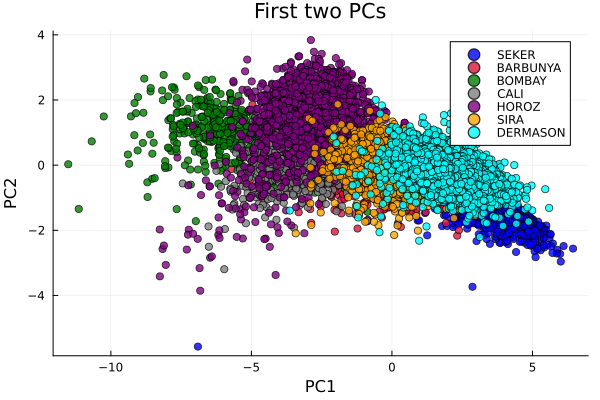

In [14]:
# Plotting first two principal components
colors = ("blue", "crimson", "green", "gray", "purple", "orange", "cyan")

pc_plot = plot(
    pc[:, 1],
    pc[:, 2],
    alpha=.0,
    xlabel="PC1",
    ylabel="PC2",
    seriestype=:scatter,
    title = "First two PCs",
    label=nothing)

for (i, class) in enumerate(unique(df.Class))
    indexes = (1:n)[df.Class .== class]

    plot!(
        pc[indexes, 1],
        pc[indexes, 2],
        color=colors[i],
        label = class,
        seriestype=:scatter,
        alpha=0.8)
end

pc_plot

In [ ]:
sum(pc[:,1] .* pc[:,2])
Statistics.mean(pc[:,10])